In [2]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import glob
import os
import cv2
import supervision as sv
import numpy as np
from math import pi

In [3]:
%matplotlib widget

In [4]:
folder = "D:/cassda-data/street-tiles/images"

In [5]:
model = YOLO(
    "../model/runs/cassda-wildlife-crossing/yolo11n-obb-wildlife_bridges-filtered-dataset-no-CH/weights/best.pt"
)

In [7]:
# run inference and display when something is detected
results = model.predict(source=folder, conf=0.6, save=False)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1562 D:\cassda-data\street-tiles\images\4017288_2573024_4018568_2574304.jpg: 640x640 (no detections), 21.4ms
image 2/1562 D:\cassda-data\street-tiles\images\4017441_2572046_4018721_2573326.jpg: 640x640 (no detections), 30.5ms
image 3/1562 D:\cassda-data\street-tiles\images\4017649_2571083_4018929_2572363.jpg: 640x640 (no detections), 20.9ms
image 4/1562 D:\cassda-data\street-tiles\images\4017807_2573795_4019087_2575075.jpg: 640x640 (no detections

#### Remove Duplicates in Predictions

In [60]:
detections = [r for r in results if r.obb and len(r.obb) > 0]
len(detections)

55

In [92]:
d = detections[1]
xmin, ymin, xmax, ymax = os.path.basename(d.path).replace(".jpg", "").split("_")

print(xmin, ymin, xmax, ymax)

detection_center = d.obb.xywhr.tolist()[0][:2]
print(detection_center)

detection_center_image_coords = (
    int(xmin) + (int(detection_center[0])  * 2),
    int(ymin) - (int(detection_center[1]) * 2)
)
dc1 = detection_center_image_coords
print(dc1)

4057683 2620904 4058963 2622184
[397.9327087402344, 122.87739562988281]
(4058477, 2620660)


In [91]:
d = detections[2]
xmin, ymin, xmax, ymax = os.path.basename(d.path).replace(".jpg", "").split("_")
detection_center = d.obb.xywhr.tolist()[0][:2]

print(xmin, ymin, xmax, ymax)
print(detection_center)

detection_center_image_coords = (
    int(xmin) + (int(detection_center[0]) * 2),
    int(ymin) - (int(detection_center[1]) * 2)
)

dc2 = detection_center_image_coords
print(dc2)

4057874 2621869 4059154 2623149
[303.4549865722656, 605.8729248046875]
(4058480, 2620659)


In [93]:
x_distance = abs(dc1[0] - dc2[0])
y_distance = abs(dc1[1] - dc2[1])
print(f"x distance: {x_distance}, y distance: {y_distance}")

x distance: 3, y distance: 1


In [62]:
def plot_detection_subset(detections_subset, nrows, ncols):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 20))
    axs = axs.flatten()

    for r, ax in zip(detections_subset, axs):
        img = r.orig_img.copy()
        ax.imshow(img)

        if r.obb and len(r.obb) > 0:
            for obb in r.obb:
                polygon = obb.xyxyxyxy.tolist()[0]
                cx, cy, w, h, angle = obb.xywhr.tolist()[0]
                poly=plt.Polygon(
                    np.array(polygon).reshape(-1, 2),
                    fill=False,
                    edgecolor="red",
                    linewidth=0.5,
                )
                ax.add_patch(poly)

                # add confidence to the polygon
                conf = obb.conf.item()
                ax.text(
                    cx + w / 2,
                    cy - h / 2,
                    f"{conf:.2f}",
                    fontsize=12,
                    color="red",
                    ha="center",
                    va="bottom",
                )
        ax.axis("off")
    plt.tight_layout()
    plt.show()

In [30]:
# create plot with 3 columns and 10 rows, repeat until all images are plotted
ncols = 3
nrows = 5
imgs_per_plot = ncols * nrows
num_plots = (len(detections) + imgs_per_plot - 1) // imgs_per_plot

def get_idx(plot_id, num_images, imgs_per_plot):
    start_idx = plot_id * imgs_per_plot
    end_idx = min(start_idx + imgs_per_plot, num_images)
    return start_idx, end_idx

Plotting images 15 to 30 out of 55


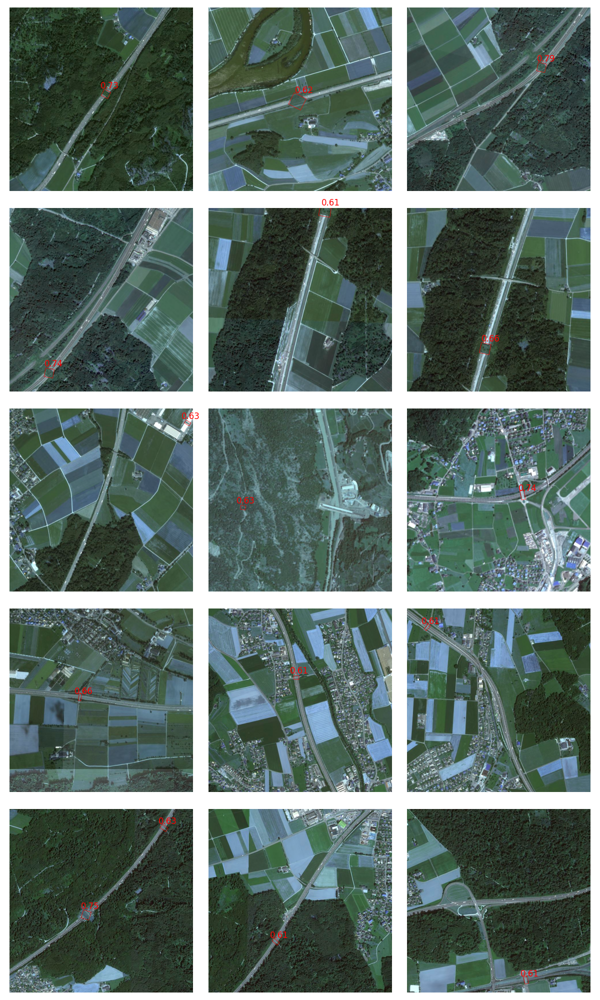

In [94]:
plot_id = 1  # Change this value to view different subsets
start_idx, end_idx = get_idx(plot_id, len(detections), imgs_per_plot)
detections_subset = detections[start_idx:end_idx]

print(f"Plotting images {start_idx} to {end_idx} out of {len(detections)}")
plot_detection_subset(detections_subset, nrows, ncols)